<hr style="height:2px; width:100%">

<h1 style="color:#32611D">Task 8HD: SIG 734 Data Wrangling - Data Cleansing and Text Analysis Challenge</h1>

<p style="color:#551D61; font-size:16px";>
    Name: &emsp;&emsp;&emsp; Suraj Mathew Thomas<br>
    Student ID: &ensp; S223509398<br>
    Email ID: &emsp;&ensp;&ensp; s223509398@deakin.edu.au<br><br>
</p>

<hr style="height:2px; width:100%">

<h2 style="color:#336699"> Introduction</h2>

<p style="color:#20568B; font-size:15px";>
This task is about text analytics. We get the XML dump of the site which contains historic posts and then convert that to a csv file to further our text analysis. We perform data wrangling, preprocessing in terms of dataset transformation, Missing Value Analysis, Data Ingestion and then dwell into the text analytics like Word Cloud and Sentiment Analysis </p>

<p style="color:#20568B; font-size:15px";>
Interactive plots like plotly has been used to depict the analysis. Since some of the visuals of these interactive plot are not visible when loaded and only when the entire workbook is run, there are pictures of these plots that are pasted below of the interactive plot. In case you would want to interact with the plot and look are the tooltips and their data, you would need to restart the kernel and run all the cells</p>

<h2 style="color:#336699"> Data Set Selected for this assignment's analysis - Travel Queries </h2>

<p style="color:#20568B; font-size:18px";>
The topic was selected from the below site </p>

[Click Here](https://stackexchange.com/sites?view=list#oldest)

<p style="color:#20568B; font-size:18px";>
The data dump in xml format has been downloaded from the below site </p>

[Click Here](https://archive.org/details/stackexchange )


The files extracted are

* Badges
* Comments
* Post History
* Posts
* Tags
* Users and, 
* Votes. 


<h2 style="color:#336699"> Goal of this Analysis </h2>

* To independently analyze each of the files loaded.
* To analyze a combination of the files and unearth any interesting insights/patters.
* To find any correlations, obeservations, inferences



<h2 style="color:#336699"> Installing the necessary Packages </h2>

In [1]:
#pip install wordcloud

In [2]:
#pip install textblob

<h2 style="color:#336699"> Importing the necessary libraries </h2>

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import wordcloud 
import nltk
import random
import string
import textblob
import xml.etree.ElementTree as ET
import csv
from IPython.display import display, Markdown
from matplotlib import cm

In [4]:
# Custom Package to Convert an xml file to a csv file - Data Transformation Stage
def xml_to_csv(file_name):
    '''
    Converts XML files to CSV.
        file_name: The name of the XML file WITHOUT the .xml extension. 
    '''
    file = file_name + '.xml' # Adds the .XML extension to establish identity and format the file.
    tree = ET.parse(file)     # Parses the XML file in as a Dictionary or Tree object. 
    root = tree.getroot()     # Locates the root, in other words, the master tag. 
    
    data = open(file_name+'.csv', 'w') # Create new blank csv called "file_name" with the extention and the write privilege
    csvwriter = csv.writer(data)       # Defines the file for the writer to write to.
    data_head = []                     # CSV Column header.

    count = 0           # Tracking Errors / Ensuring CSV header is set etc. 
    for child in root:  # For each child (row) under root. 
        if count == 0:  # If first enrty, create CSV header. 
            for attribute in child.attrib:
                data_head.append(attribute)
            count += 1
            #print(data_head) # For testing/viewing initial CSV header.
            
            csvwriter.writerow(data_head) # Add header to CSV.
        else:
            row = child.attrib            # Copy next row. 
            new_row = []                  # To hold each element's value.
            
            for i in range(len(data_head)):           # For each column
                if data_head[i] in row:               # If a value is present.
                    new_row.append(row[data_head[i]]) # Appends that vale to the new_row list.
                else: 
                    #print('Key Error, line:', count, 'ID:', row['Id'], 'Missing Key:', data_head[i])
                    new_row.append(np.nan) # Error handeling, replaces missing values with NaN. 
                
            csvwriter.writerow(new_row) # Adds a new row to the CSV.
            count += 1
    
    if len(file_name) < 8: # Formats output to confirm all rows are added to the CSV. 
        print(f'{file_name}\t\ttotal rows:\t{count:,}') 
    else:
        print(f'{file_name}\ttotal rows:\t{count:,}') 
        
    data.close()
    return file_name+'.csv'

<h2 style="color:#336699"> Converting files from XML to CSV by calling the custom conversion function </h2>

In [5]:
#Converting the Files to CSV
Badges_csv = xml_to_csv('Badges')
Comments_csv = xml_to_csv('Comments')
Tags_csv = xml_to_csv('Tags')
Users_csv = xml_to_csv('Users')
Votes_csv = xml_to_csv('Votes')
PostHistory_csv = xml_to_csv('PostHistory')
PostLinks_csv = xml_to_csv('PostLinks')
Posts_csv = xml_to_csv('Posts')

Badges		total rows:	219,674
Comments	total rows:	299,400
Tags		total rows:	1,954
Users		total rows:	105,401
Votes		total rows:	1,038,332
PostHistory	total rows:	454,635
PostLinks	total rows:	30,517
Posts		total rows:	128,164


<h2 style="color:#336699"> Loading the Converted CSV files into a DataFrame for further analysis </h2>

In [6]:
badges = pd.read_csv(Badges_csv)
comments = pd.read_csv(Comments_csv)
posts = pd.read_csv(Posts_csv)
tags = pd.read_csv(Tags_csv)
users = pd.read_csv(Users_csv)
votes = pd.read_csv(Votes_csv)
post_history = pd.read_csv(PostHistory_csv)
post_links = pd.read_csv(PostLinks_csv)

<h2 style="color:#336699"> Checking if the files are properly loaded </h2>

In [7]:
badges.head()

,Id,UserId,Name,Date,Class,TagBased
0,2,3,Autobiographer,2011-06-21T20:16:48.910,3,False
1,3,4,Autobiographer,2011-06-21T20:16:48.910,3,False
2,4,6,Autobiographer,2011-06-21T20:21:49.157,3,False
3,5,8,Autobiographer,2011-06-21T20:21:49.157,3,False
4,6,9,Autobiographer,2011-06-21T20:21:49.157,3,False


In [8]:
comments.head()

,Id,PostId,Score,Text,CreationDate,UserId,ContentLicense
0,2,1,0,"Toronto, Ontario. We can fly out of anywhere t...",2011-06-21T20:27:35.300,9.0,CC BY-SA 3.0
1,3,1,3,"""Best"" for what? Please read [this page](http...",2011-06-21T20:32:23.687,20.0,CC BY-SA 3.0
2,9,25,0,"Are you in the UK? If so, would be helpful to ...",2011-06-21T20:42:08.330,30.0,CC BY-SA 3.0
3,12,26,3,"Where are you starting from, and what sort of ...",2011-06-21T20:44:09.990,26.0,CC BY-SA 3.0
4,13,19,0,"What do you mean by ""stops short of Eurail?"". ...",2011-06-21T20:44:40.777,30.0,CC BY-SA 3.0


In [9]:
posts.head()

,Id,PostTypeId,AcceptedAnswerId,CreationDate,Score,ViewCount,Body,OwnerUserId,LastEditorUserId,LastEditDate,LastActivityDate,Title,Tags,AnswerCount,CommentCount,ClosedDate,ContentLicense
0,2,1,NaN,2011-06-21T20:22:33.760,43,3659.0,"<p>This was one of our definition questions, b...",13.0,19400.0,2021-04-27T00:47:20.470,2023-08-12T06:54:42.737,How can I find a guide who will take me safely...,<guides><extreme-tourism><amazon-river><amazon...,8.0,4,NaN,CC BY-SA 4.0
1,3,2,NaN,2011-06-21T20:24:28.080,15,NaN,<p>One way would be to go through an Adventure...,9.0,NaN,NaN,2011-06-21T20:24:28.080,NaN,NaN,NaN,2,NaN,CC BY-SA 3.0
2,4,1,NaN,2011-06-21T20:24:57.160,8,301.0,<p>Singapore Airlines has an all-business clas...,24.0,693.0,2013-01-09T09:55:22.743,2013-01-09T09:55:22.743,Does Singapore Airlines offer any reward seats...,<loyalty-programs><routes><ewr><singapore-airl...,1.0,1,NaN,CC BY-SA 3.0
3,5,1,770.0,2011-06-21T20:25:56.787,14,520.0,<p>Another definition question that interested...,13.0,101.0,2011-12-28T21:36:18.230,2012-10-12T20:49:08.110,What is the easiest transportation to use thro...,<romania><transportation>,5.0,0,NaN,CC BY-SA 3.0
4,6,1,12.0,2011-06-21T20:26:53.323,89,8093.0,"<p>A year ago I was reading some magazine, and...",19.0,NaN,2013-03-21T16:45:37.987,2013-03-21T16:45:37.987,How can I visit Antarctica?,<extreme-tourism><antarctica>,6.0,9,NaN,CC BY-SA 3.0


In [10]:
tags.head()

,Id,TagName,Count,ExcerptPostId,WikiPostId
0,2,caribbean,56,357.0,356.0
1,4,vacations,56,319.0,318.0
2,6,amazon-river,10,14548.0,14547.0
3,8,romania,188,1792.0,1791.0
4,9,transportation,481,1183.0,1182.0


In [11]:
users.head()

,Id,Reputation,CreationDate,DisplayName,LastAccessDate,WebsiteUrl,Location,AboutMe,Views,UpVotes,DownVotes,AccountId
0,2,101,2011-06-21T20:10:03.720,Geoff Dalgas,2017-10-09T14:25:03.613,http://stackoverflow.com,"Corvallis, OR",<p>Dev #2 who helped create Stack Overflow cur...,43,1,0,2.0
1,3,101,2011-06-21T20:11:02.490,Nick Craver,2019-11-13T23:54:04.630,https://nickcraver.com/blog/,"Winston-Salem, NC",<p>I am a Principal Software Engineer at Micro...,26,1,0,7598.0
2,4,101,2011-06-21T20:12:21.223,Emmett,2019-09-05T02:57:12.997,http://minesweeperonline.com,"San Francisco, CA","<p>co-founder of <a href=""https://airtable.com...",16,1,0,1998.0
3,5,101,2011-06-21T20:15:31.410,Kevin Montrose,2019-05-21T18:43:29.443,https://kevinmontrose.com,"New York, NY, United States","<p><a href=""http://blog.stackoverflow.com/2010...",14,3,0,29738.0
4,6,101,2011-06-21T20:18:07.337,Jimmy Sawczuk,2020-04-01T15:45:18.433,https://jimmysawczuk.com,"Rock Hill, SC, United States","\n\n<p>I am a 2009 graduate of <a href=""http:/...",11,0,0,142521.0


In [12]:
votes.head()

,Id,PostId,VoteTypeId,CreationDate
0,2,1,2,2011-06-21T00:00:00.000
1,3,2,2,2011-06-21T00:00:00.000
2,4,3,2,2011-06-21T00:00:00.000
3,7,7,2,2011-06-21T00:00:00.000
4,8,6,2,2011-06-21T00:00:00.000


In [13]:
post_history.head()

,Id,PostHistoryTypeId,PostId,RevisionGUID,CreationDate,UserId,Text,ContentLicense
0,2,1,1,1e04af17-3bdb-4263-aa46-97ee7fb1b0b6,2011-06-21T20:19:34.730,9.0,What's the best Caribbean cruise for October,CC BY-SA 3.0
1,3,3,1,1e04af17-3bdb-4263-aa46-97ee7fb1b0b6,2011-06-21T20:19:34.730,9.0,<caribbean><cruising><vacations>,CC BY-SA 3.0
2,4,2,2,58500a29-b9ed-4802-9934-c173ce362758,2011-06-21T20:22:33.760,13.0,"This was one of our definition questions, but ...",CC BY-SA 3.0
3,5,1,2,58500a29-b9ed-4802-9934-c173ce362758,2011-06-21T20:22:33.760,13.0,How can I find a guide that will take me safel...,CC BY-SA 3.0
4,6,3,2,58500a29-b9ed-4802-9934-c173ce362758,2011-06-21T20:22:33.760,13.0,<guides><amazon-river>,CC BY-SA 3.0


In [14]:
post_links.head()

,Id,CreationDate,PostId,RelatedPostId,LinkTypeId
0,1304,2011-06-21T22:55:01.307,110,10,1
1,2930,2011-06-22T11:58:39.763,203,185,1
2,2981,2011-06-22T12:32:01.393,189,105,1
3,3507,2011-06-22T20:56:20.637,226,185,1
4,3883,2011-06-23T10:39:22.087,289,11,1


<h2 style="color:#336699"> Data Analysis - Pre-processing </h2>

### BADGES

In [15]:
badges.head()

,Id,UserId,Name,Date,Class,TagBased
0,2,3,Autobiographer,2011-06-21T20:16:48.910,3,False
1,3,4,Autobiographer,2011-06-21T20:16:48.910,3,False
2,4,6,Autobiographer,2011-06-21T20:21:49.157,3,False
3,5,8,Autobiographer,2011-06-21T20:21:49.157,3,False
4,6,9,Autobiographer,2011-06-21T20:21:49.157,3,False


In [16]:
badges.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219673 entries, 0 to 219672
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   Id        219673 non-null  int64 
 1   UserId    219673 non-null  int64 
 2   Name      219673 non-null  object
 3   Date      219673 non-null  object
 4   Class     219673 non-null  int64 
 5   TagBased  219673 non-null  bool  
dtypes: bool(1), int64(3), object(2)
memory usage: 8.6+ MB


#### Badges do not seem to have any missing data. Let us confirm once. The Data is recorded as an object and we would have to convert it to a Data/DataTime data type

In [17]:
#Missing Value Analysis
missing_values=pd.DataFrame(badges.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / badges.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.0
1,UserId,0,0.0
2,Name,0,0.0
3,Date,0,0.0
4,Class,0,0.0
5,TagBased,0,0.0


In [18]:
#Checking for duplicate rows
is_duplicate = badges.duplicated() #Checking to see if there are any duplicate rows in the dataset
print('Number of duplicate rows = %d' % (is_duplicate.sum()))

Number of duplicate rows = 0


In [19]:
categorical_features=[]
numerical_features=[]
for i in badges.columns:
    if badges[i].dtype=="object":
        categorical_features.append(i)
    else:
        numerical_features.append(i)
print(categorical_features) 
print(numerical_features)

['Name', 'Date']
['Id', 'UserId', 'Class', 'TagBased']


#### Converting the Data from Object Data Type to Date Time Data Type

In [20]:
badges.Date = pd.to_datetime(badges.Date)
badges.dtypes

Id                   int64
UserId               int64
Name                object
Date        datetime64[ns]
Class                int64
TagBased              bool
dtype: object

In [21]:
badges.head(2)

,Id,UserId,Name,Date,Class,TagBased
0,2,3,Autobiographer,2011-06-21 20:16:48.910,3,False
1,3,4,Autobiographer,2011-06-21 20:16:48.910,3,False


### COMMENTS

In [22]:
comments.head()

,Id,PostId,Score,Text,CreationDate,UserId,ContentLicense
0,2,1,0,"Toronto, Ontario. We can fly out of anywhere t...",2011-06-21T20:27:35.300,9.0,CC BY-SA 3.0
1,3,1,3,"""Best"" for what? Please read [this page](http...",2011-06-21T20:32:23.687,20.0,CC BY-SA 3.0
2,9,25,0,"Are you in the UK? If so, would be helpful to ...",2011-06-21T20:42:08.330,30.0,CC BY-SA 3.0
3,12,26,3,"Where are you starting from, and what sort of ...",2011-06-21T20:44:09.990,26.0,CC BY-SA 3.0
4,13,19,0,"What do you mean by ""stops short of Eurail?"". ...",2011-06-21T20:44:40.777,30.0,CC BY-SA 3.0


In [23]:
comments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299399 entries, 0 to 299398
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Id              299399 non-null  int64  
 1   PostId          299399 non-null  int64  
 2   Score           299399 non-null  int64  
 3   Text            299399 non-null  object 
 4   CreationDate    299399 non-null  object 
 5   UserId          288860 non-null  float64
 6   ContentLicense  299399 non-null  object 
dtypes: float64(1), int64(3), object(3)
memory usage: 16.0+ MB


In [24]:
#Missing Value Analysis
missing_values=pd.DataFrame(comments.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / comments.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.00
1,PostId,0,0.00
2,Score,0,0.00
3,Text,0,0.00
4,CreationDate,0,0.00
5,UserId,10539,3.52
6,ContentLicense,0,0.00


#### Comments DataFrame has missing values in the UserId column.  3.5% of the UserIds are missing. A comment without a UserId does not serve much for out analysis. These could have been from the badges dataframe where there was User Name and ID which have  not been recorded here in the comments table. We are going to remove these comments which have missing UserIds. Content License column will also not make sense for our analysis, hence we will go ahead and drop that column as well

In [25]:
comments.dropna(inplace=True)
comments.drop('ContentLicense', axis=1, inplace=True)
print(comments.shape)
comments.isna().apply([np.sum])

(288860, 6)


,Id,PostId,Score,Text,CreationDate,UserId
sum,0,0,0,0,0,0


#### Creation data is object data type. We will go ahead and convert that into datetime data type.

In [26]:
comments.CreationDate = pd.to_datetime(comments.CreationDate)
comments.dtypes

Id                       int64
PostId                   int64
Score                    int64
Text                    object
CreationDate    datetime64[ns]
UserId                 float64
dtype: object

### TAGS

In [27]:
tags.head()

,Id,TagName,Count,ExcerptPostId,WikiPostId
0,2,caribbean,56,357.0,356.0
1,4,vacations,56,319.0,318.0
2,6,amazon-river,10,14548.0,14547.0
3,8,romania,188,1792.0,1791.0
4,9,transportation,481,1183.0,1182.0


In [28]:
tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1953 entries, 0 to 1952
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1953 non-null   int64  
 1   TagName        1953 non-null   object 
 2   Count          1953 non-null   int64  
 3   ExcerptPostId  1881 non-null   float64
 4   WikiPostId     1881 non-null   float64
dtypes: float64(2), int64(2), object(1)
memory usage: 76.4+ KB


In [29]:
#Missing Value Analysis
missing_values=pd.DataFrame(tags.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / tags.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.00
1,TagName,0,0.00
2,Count,0,0.00
3,ExcerptPostId,72,3.69
4,WikiPostId,72,3.69


#### We will go ahead and drop the NaN values in the ExcerptPostId. NaN values are not going to give us any inferences in our analysis

In [30]:
tags.dropna(subset=['ExcerptPostId'], inplace=True)
print(tags.shape)
tags.isna().apply([np.sum])

(1881, 5)


,Id,TagName,Count,ExcerptPostId,WikiPostId
sum,0,0,0,0,0


### USERS

In [31]:
users.head()

,Id,Reputation,CreationDate,DisplayName,LastAccessDate,WebsiteUrl,Location,AboutMe,Views,UpVotes,DownVotes,AccountId
0,2,101,2011-06-21T20:10:03.720,Geoff Dalgas,2017-10-09T14:25:03.613,http://stackoverflow.com,"Corvallis, OR",<p>Dev #2 who helped create Stack Overflow cur...,43,1,0,2.0
1,3,101,2011-06-21T20:11:02.490,Nick Craver,2019-11-13T23:54:04.630,https://nickcraver.com/blog/,"Winston-Salem, NC",<p>I am a Principal Software Engineer at Micro...,26,1,0,7598.0
2,4,101,2011-06-21T20:12:21.223,Emmett,2019-09-05T02:57:12.997,http://minesweeperonline.com,"San Francisco, CA","<p>co-founder of <a href=""https://airtable.com...",16,1,0,1998.0
3,5,101,2011-06-21T20:15:31.410,Kevin Montrose,2019-05-21T18:43:29.443,https://kevinmontrose.com,"New York, NY, United States","<p><a href=""http://blog.stackoverflow.com/2010...",14,3,0,29738.0
4,6,101,2011-06-21T20:18:07.337,Jimmy Sawczuk,2020-04-01T15:45:18.433,https://jimmysawczuk.com,"Rock Hill, SC, United States","\n\n<p>I am a 2009 graduate of <a href=""http:/...",11,0,0,142521.0


In [32]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105400 entries, 0 to 105399
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Id              105400 non-null  int64  
 1   Reputation      105400 non-null  int64  
 2   CreationDate    105400 non-null  object 
 3   DisplayName     105396 non-null  object 
 4   LastAccessDate  105400 non-null  object 
 5   WebsiteUrl      19177 non-null   object 
 6   Location        32066 non-null   object 
 7   AboutMe         27835 non-null   object 
 8   Views           105400 non-null  int64  
 9   UpVotes         105400 non-null  int64  
 10  DownVotes       105400 non-null  int64  
 11  AccountId       105394 non-null  float64
dtypes: float64(1), int64(5), object(6)
memory usage: 9.6+ MB


In [33]:
#Missing Value Analysis
missing_values=pd.DataFrame(users.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / users.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.00
1,Reputation,0,0.00
2,CreationDate,0,0.00
3,DisplayName,4,0.00
4,LastAccessDate,0,0.00
5,WebsiteUrl,86223,81.81
6,Location,73334,69.58
7,AboutMe,77565,73.59
8,Views,0,0.00
9,UpVotes,0,0.00


#### 75% to 85% of the data is missing in the Website Url, Location and About Me columns. We will go ahead and remove these columns as there wont be much of information loss that emminates out of these columns.

#### Next we will go ahead and change the LasAccessDate data type to DateTime data type and then the 2 missing Display Names and Unknown

In [34]:
users.drop(['WebsiteUrl','Location','AboutMe'], axis=1, inplace=True)
users.LastAccessDate = pd.to_datetime(users.LastAccessDate)

no_name_condition = users.DisplayName.isna()
users.loc[no_name_condition, 'DisplayName'] = 'UNKNOWN'

print(users.shape, '\n')
print(users.dtypes)
users.isna().apply([np.sum])

(105400, 9) 

Id                         int64
Reputation                 int64
CreationDate              object
DisplayName               object
LastAccessDate    datetime64[ns]
Views                      int64
UpVotes                    int64
DownVotes                  int64
AccountId                float64
dtype: object


,Id,Reputation,CreationDate,DisplayName,LastAccessDate,Views,UpVotes,DownVotes,AccountId
sum,0,0,0,0,0,0,0,0,6


### VOTES

In [35]:
votes.head()

,Id,PostId,VoteTypeId,CreationDate
0,2,1,2,2011-06-21T00:00:00.000
1,3,2,2,2011-06-21T00:00:00.000
2,4,3,2,2011-06-21T00:00:00.000
3,7,7,2,2011-06-21T00:00:00.000
4,8,6,2,2011-06-21T00:00:00.000


In [36]:
votes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1038331 entries, 0 to 1038330
Data columns (total 4 columns):
 #   Column        Non-Null Count    Dtype 
---  ------        --------------    ----- 
 0   Id            1038331 non-null  int64 
 1   PostId        1038331 non-null  int64 
 2   VoteTypeId    1038331 non-null  int64 
 3   CreationDate  1038331 non-null  object
dtypes: int64(3), object(1)
memory usage: 31.7+ MB


In [37]:
# Converting the Cretion Data data type to DateTime
votes.CreationDate = pd.to_datetime(votes.CreationDate)
votes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1038331 entries, 0 to 1038330
Data columns (total 4 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   Id            1038331 non-null  int64         
 1   PostId        1038331 non-null  int64         
 2   VoteTypeId    1038331 non-null  int64         
 3   CreationDate  1038331 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3)
memory usage: 31.7 MB


### POST HISTORY

In [38]:
post_history.head()

,Id,PostHistoryTypeId,PostId,RevisionGUID,CreationDate,UserId,Text,ContentLicense
0,2,1,1,1e04af17-3bdb-4263-aa46-97ee7fb1b0b6,2011-06-21T20:19:34.730,9.0,What's the best Caribbean cruise for October,CC BY-SA 3.0
1,3,3,1,1e04af17-3bdb-4263-aa46-97ee7fb1b0b6,2011-06-21T20:19:34.730,9.0,<caribbean><cruising><vacations>,CC BY-SA 3.0
2,4,2,2,58500a29-b9ed-4802-9934-c173ce362758,2011-06-21T20:22:33.760,13.0,"This was one of our definition questions, but ...",CC BY-SA 3.0
3,5,1,2,58500a29-b9ed-4802-9934-c173ce362758,2011-06-21T20:22:33.760,13.0,How can I find a guide that will take me safel...,CC BY-SA 3.0
4,6,3,2,58500a29-b9ed-4802-9934-c173ce362758,2011-06-21T20:22:33.760,13.0,<guides><amazon-river>,CC BY-SA 3.0


In [39]:
post_history.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 454634 entries, 0 to 454633
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Id                 454634 non-null  int64  
 1   PostHistoryTypeId  454634 non-null  int64  
 2   PostId             454634 non-null  int64  
 3   RevisionGUID       454634 non-null  object 
 4   CreationDate       454634 non-null  object 
 5   UserId             395190 non-null  float64
 6   Text               402463 non-null  object 
 7   ContentLicense     403370 non-null  object 
dtypes: float64(1), int64(3), object(4)
memory usage: 27.7+ MB


In [40]:
#Missing Value Analysis
missing_values=pd.DataFrame(post_history.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / post_history.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.00
1,PostHistoryTypeId,0,0.00
2,PostId,0,0.00
3,RevisionGUID,0,0.00
4,CreationDate,0,0.00
5,UserId,59444,13.08
6,Text,52171,11.48
7,ContentLicense,51264,11.28


#### We will remove the 13% missing UserIDs

In [41]:
post_history.dropna(subset=['UserId'], inplace=True)
post_history.isna().apply([np.sum])

,Id,PostHistoryTypeId,PostId,RevisionGUID,CreationDate,UserId,Text,ContentLicense
sum,0,0,0,0,0,0,11333,23721


In [42]:
#Missing Value Analysis
missing_values=pd.DataFrame(post_history.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / post_history.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.00
1,PostHistoryTypeId,0,0.00
2,PostId,0,0.00
3,RevisionGUID,0,0.00
4,CreationDate,0,0.00
5,UserId,0,0.00
6,Text,11333,2.87
7,ContentLicense,23721,6.00


#### We still have 3% of  the values in the Text column missing. We will remove bothe the Text and Content License Column and update the data type of the Creation Date to DateTime

In [43]:
post_history.dropna(subset=['Text'], inplace=True)
post_history.dropna(axis=1, inplace=True)
post_history.CreationDate = pd.to_datetime(post_history.CreationDate)

print(post_history.shape, '\n')
print(post_history.dtypes)
post_history.isna().apply([np.sum])

(383857, 7) 

Id                            int64
PostHistoryTypeId             int64
PostId                        int64
RevisionGUID                 object
CreationDate         datetime64[ns]
UserId                      float64
Text                         object
dtype: object


,Id,PostHistoryTypeId,PostId,RevisionGUID,CreationDate,UserId,Text
sum,0,0,0,0,0,0,0


### POST LINKS

In [44]:
post_links.head()

,Id,CreationDate,PostId,RelatedPostId,LinkTypeId
0,1304,2011-06-21T22:55:01.307,110,10,1
1,2930,2011-06-22T11:58:39.763,203,185,1
2,2981,2011-06-22T12:32:01.393,189,105,1
3,3507,2011-06-22T20:56:20.637,226,185,1
4,3883,2011-06-23T10:39:22.087,289,11,1


In [45]:
post_links.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30516 entries, 0 to 30515
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Id             30516 non-null  int64 
 1   CreationDate   30516 non-null  object
 2   PostId         30516 non-null  int64 
 3   RelatedPostId  30516 non-null  int64 
 4   LinkTypeId     30516 non-null  int64 
dtypes: int64(4), object(1)
memory usage: 1.2+ MB


In [46]:
#Missing Value Analysis
missing_values=pd.DataFrame(post_links.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / post_links.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.0
1,CreationDate,0,0.0
2,PostId,0,0.0
3,RelatedPostId,0,0.0
4,LinkTypeId,0,0.0


#### There are no missing values in this dataframe. We will covert the CreationDate to a DateTime data type

In [47]:
post_links.CreationDate = pd.to_datetime(post_links.CreationDate)
post_links.dtypes
print(post_links.shape, '\n')
print(post_links.dtypes)

(30516, 5) 

Id                        int64
CreationDate     datetime64[ns]
PostId                    int64
RelatedPostId             int64
LinkTypeId                int64
dtype: object


### POSTS

In [48]:
posts.head()

,Id,PostTypeId,AcceptedAnswerId,CreationDate,Score,ViewCount,Body,OwnerUserId,LastEditorUserId,LastEditDate,LastActivityDate,Title,Tags,AnswerCount,CommentCount,ClosedDate,ContentLicense
0,2,1,NaN,2011-06-21T20:22:33.760,43,3659.0,"<p>This was one of our definition questions, b...",13.0,19400.0,2021-04-27T00:47:20.470,2023-08-12T06:54:42.737,How can I find a guide who will take me safely...,<guides><extreme-tourism><amazon-river><amazon...,8.0,4,NaN,CC BY-SA 4.0
1,3,2,NaN,2011-06-21T20:24:28.080,15,NaN,<p>One way would be to go through an Adventure...,9.0,NaN,NaN,2011-06-21T20:24:28.080,NaN,NaN,NaN,2,NaN,CC BY-SA 3.0
2,4,1,NaN,2011-06-21T20:24:57.160,8,301.0,<p>Singapore Airlines has an all-business clas...,24.0,693.0,2013-01-09T09:55:22.743,2013-01-09T09:55:22.743,Does Singapore Airlines offer any reward seats...,<loyalty-programs><routes><ewr><singapore-airl...,1.0,1,NaN,CC BY-SA 3.0
3,5,1,770.0,2011-06-21T20:25:56.787,14,520.0,<p>Another definition question that interested...,13.0,101.0,2011-12-28T21:36:18.230,2012-10-12T20:49:08.110,What is the easiest transportation to use thro...,<romania><transportation>,5.0,0,NaN,CC BY-SA 3.0
4,6,1,12.0,2011-06-21T20:26:53.323,89,8093.0,"<p>A year ago I was reading some magazine, and...",19.0,NaN,2013-03-21T16:45:37.987,2013-03-21T16:45:37.987,How can I visit Antarctica?,<extreme-tourism><antarctica>,6.0,9,NaN,CC BY-SA 3.0


In [49]:
posts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128163 entries, 0 to 128162
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Id                128163 non-null  int64  
 1   PostTypeId        128163 non-null  int64  
 2   AcceptedAnswerId  19094 non-null   float64
 3   CreationDate      128163 non-null  object 
 4   Score             128163 non-null  int64  
 5   ViewCount         48039 non-null   float64
 6   Body              127716 non-null  object 
 7   OwnerUserId       123349 non-null  float64
 8   LastEditorUserId  67200 non-null   float64
 9   LastEditDate      71224 non-null   object 
 10  LastActivityDate  128163 non-null  object 
 11  Title             48039 non-null   object 
 12  Tags              48039 non-null   object 
 13  AnswerCount       48039 non-null   float64
 14  CommentCount      128163 non-null  int64  
 15  ClosedDate        10200 non-null   object 
 16  ContentLicense    12

In [50]:
#Missing Value Analysis
missing_values=pd.DataFrame(posts.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / posts.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.00
1,PostTypeId,0,0.00
2,AcceptedAnswerId,109069,85.10
3,CreationDate,0,0.00
4,Score,0,0.00
5,ViewCount,80124,62.52
6,Body,447,0.35
7,OwnerUserId,4814,3.76
8,LastEditorUserId,60963,47.57
9,LastEditDate,56939,44.43


#### The Post dataframe has a lot of missing values in its columns. Posts without Body content are not required. Therefore we can go ahead and remove them. If the OwnerUserID is Null/NaN we will not be able to find a link or join with other dataframes. Therefore we will go ahead and remove that as well.

In [51]:
posts.dropna(subset=['OwnerUserId', 'Body'], inplace=True)
print(posts.shape)

(122902, 17)


In [52]:
#Missing Value Analysis
missing_values=pd.DataFrame(posts.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / posts.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,Id,0,0.00
1,PostTypeId,0,0.00
2,AcceptedAnswerId,104530,85.05
3,CreationDate,0,0.00
4,Score,0,0.00
5,ViewCount,76158,61.97
6,Body,0,0.00
7,OwnerUserId,0,0.00
8,LastEditorUserId,57420,46.72
9,LastEditDate,54488,44.33


#### We will now look at the other columns that have missing values and look at the relevancy of retaining or eliminating it in context to our analysis

#### We will drop the following columns as they do not add any value to the analysis (Last Editor User ID, Last Edit Date)

#### We will retain the others, though they have missing values

In [53]:
posts.drop(axis=1, columns=['LastEditorUserId', 'LastEditDate'], inplace=True)
print(posts.shape)
posts.isna().apply([np.sum]) 

(122902, 15)


,Id,PostTypeId,AcceptedAnswerId,CreationDate,Score,ViewCount,Body,OwnerUserId,LastActivityDate,Title,Tags,AnswerCount,CommentCount,ClosedDate,ContentLicense
sum,0,0,104530,0,0,76158,0,0,0,76158,76158,76158,0,112881,0


#### We will also remove the Content License Column

In [54]:
posts.drop(axis=1, columns=['ContentLicense'], inplace=True)
print(posts.shape)
posts.isna().apply([np.sum]) 

(122902, 14)


,Id,PostTypeId,AcceptedAnswerId,CreationDate,Score,ViewCount,Body,OwnerUserId,LastActivityDate,Title,Tags,AnswerCount,CommentCount,ClosedDate
sum,0,0,104530,0,0,76158,0,0,0,76158,76158,76158,0,112881


In [55]:
missing_view = posts.ViewCount.isna()
posts_clean = posts.loc[~missing_view, :].copy()
print(posts_clean.shape)
print('Difference:', posts.shape[0] - posts_clean.shape[0])
posts_clean.isna().apply([np.sum])

(46744, 14)
Difference: 76158


,Id,PostTypeId,AcceptedAnswerId,CreationDate,Score,ViewCount,Body,OwnerUserId,LastActivityDate,Title,Tags,AnswerCount,CommentCount,ClosedDate
sum,0,0,28372,0,0,0,0,0,0,0,0,0,0,36723


#### The difference 76158 is the same number of missing values in (View Count, Title, Tags and Answer Count columns). For further analysis it would be prudent to use only the clean 46,744 records. We will retain both the dataframes and see where we can apply/use them.

#### Updating the date columns data type in both the posts original dataframe and the posts_clean dataframe.

In [56]:
posts.CreationDate = pd.to_datetime(posts.CreationDate)
posts.LastActivityDate = pd.to_datetime(posts.LastActivityDate)

posts_clean.CreationDate = pd.to_datetime(posts_clean.CreationDate)
posts_clean.LastActivityDate = pd.to_datetime(posts_clean.LastActivityDate)

posts_clean.dtypes

Id                           int64
PostTypeId                   int64
AcceptedAnswerId           float64
CreationDate        datetime64[ns]
Score                        int64
ViewCount                  float64
Body                        object
OwnerUserId                float64
LastActivityDate    datetime64[ns]
Title                       object
Tags                        object
AnswerCount                float64
CommentCount                 int64
ClosedDate                  object
dtype: object

### Exploration and Visualizing the Data

### Badges - The Most Popular

In [57]:
badges.columns

Index(['Id', 'UserId', 'Name', 'Date', 'Class', 'TagBased'], dtype='object')

### Word Cloud - Most Common Badges

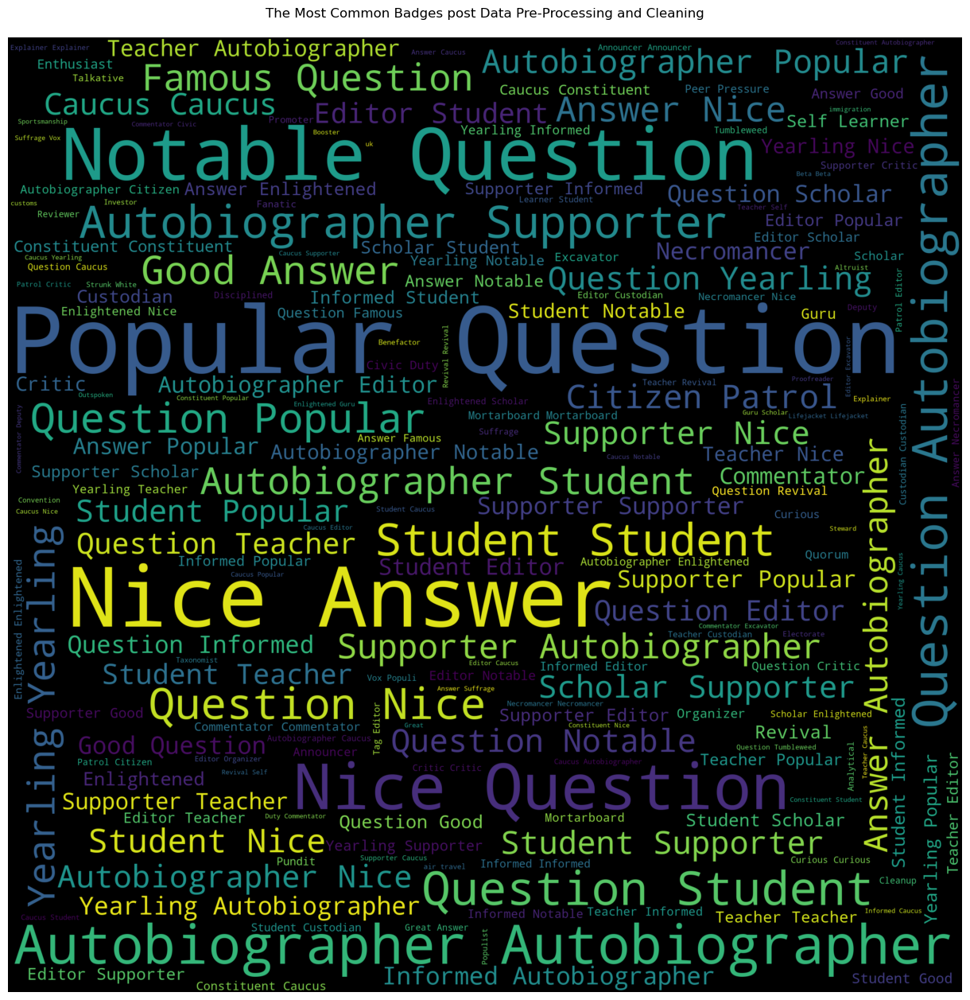

In [58]:
from wordcloud import WordCloud

# Preparing the Series object for mapping
tag_names = badges.Name.astype('string')
tag_names = tag_names.tolist()
tag_names = ' '.join(str(tag_names).split("\', '"))

# Set word cloud parameters
wordcloud = WordCloud(width = 2500, height = 2500, margin=8, background_color='black', min_font_size = 10).generate(tag_names)

# Display the word cloud:
plt.figure(figsize = (15, 12), facecolor = None) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.tight_layout(pad = 0) 
plt.title('The Most Common Badges post Data Pre-Processing and Cleaning\n')
plt.show()

### Let us group the badges names by the User ID and Name and display the number of times the badge has been used by the user

In [59]:
user_badges = pd.DataFrame(badges.groupby(['UserId', 'Name'])['Name'].count())
user_badges.rename(columns={'Name':'Badge_Count'}, inplace=True)
user_badges.reset_index(inplace=True)

In [60]:
user_badges.head()

,UserId,Name,Badge_Count
0,2,Announcer,2
1,2,Informed,1
2,2,Supporter,1
3,3,Autobiographer,1
4,3,Supporter,1


In [61]:
badge_stats = user_badges.groupby(['UserId'], as_index=False)['Badge_Count'].sum()
pd.DataFrame(badge_stats.Badge_Count.describe())

,Badge_Count
count,66240.000000
mean,3.316319
std,17.527869
min,1.000000
25%,1.000000
50%,1.000000
75%,3.000000
max,2254.000000


#### We can infer from the above stats that majority of the user have only one badge associated with their User ID. The max number of badges is 2254. This is a huge difference. The average user has only one badge but then the extreme outlier 2254. This could be a paid agency also, we do not know unless we have more insights into the task.

### Analyzing Users with the most badges

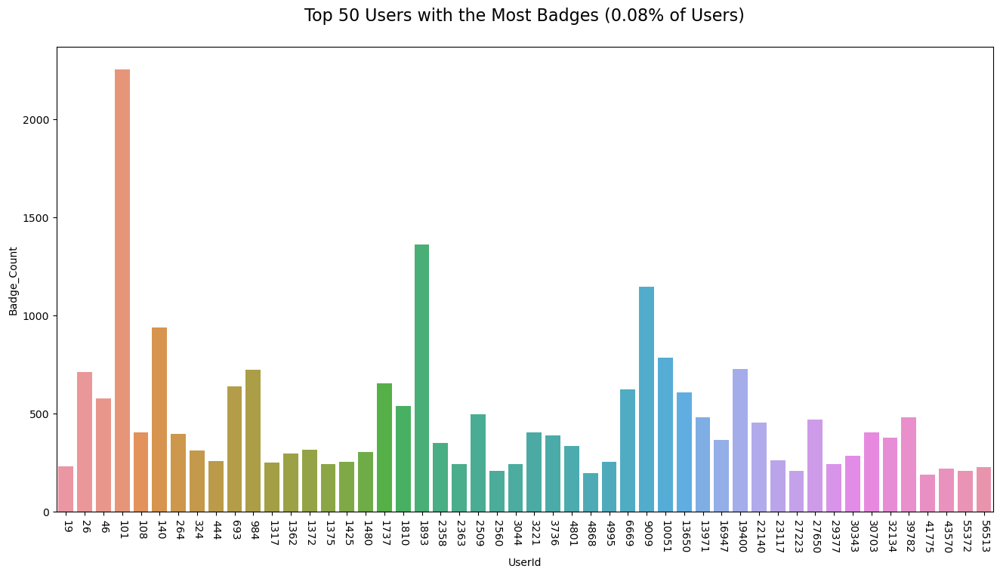

In [62]:
X = 50
percent = (X/len(badge_stats.UserId.unique()))*100

top_x = badge_stats.sort_values(by='Badge_Count', ascending=False)
top_x.reset_index(drop=True, inplace=True)
top_x = top_x.iloc[:X,:]

plt.figure(figsize=(16, 8))
plt.title(f'Top {X} Users with the Most Badges ({percent:.2f}% of Users)\n', fontsize=16)
plt.xticks(rotation=270)

sns.barplot(data=top_x, x='UserId', y='Badge_Count', errorbar=None);

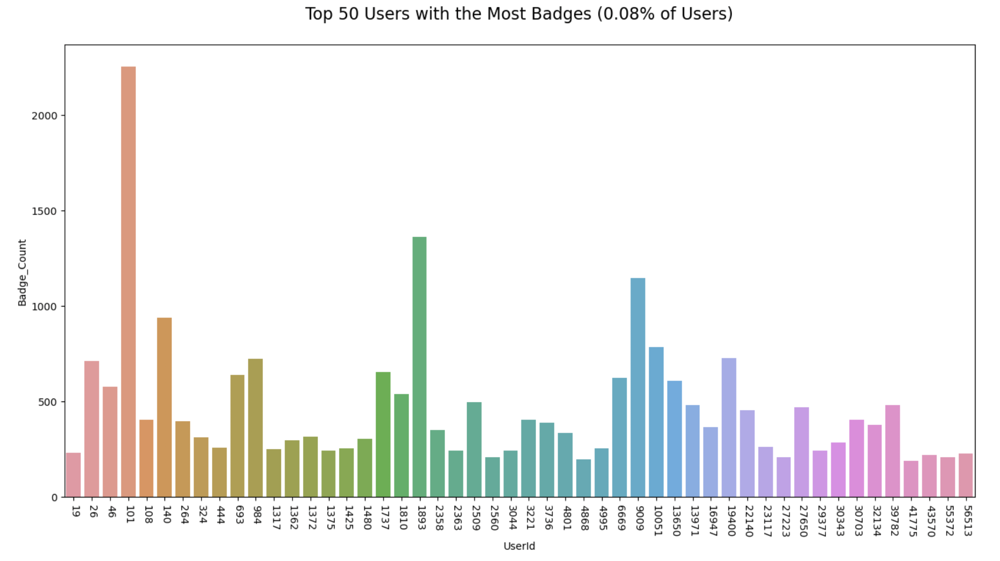

In [63]:
#Using Plotly - Interactive Chart, let us see the badge count bifurcated by the name of the badge and the user id

import plotly.io as pio
pio.renderers.default='notebook'

Bdgs = 200

#grouping by the User ID and the Badge Name and then aggregating the Badges count.
user_badges_grouped = pd.DataFrame(user_badges.groupby(['UserId', 'Name'])['Badge_Count'].sum()) 
user_badges_sorted = user_badges_grouped.sort_values(by='Badge_Count', ascending=False) #order the graph in descending order
user_badges_sorted.reset_index(inplace=True) #restting the index of the sorted dataframe
top_bdgs = user_badges_sorted.loc[:Bdgs, :].copy() # taking a copy of the sorted dataframe to further use it
top_bdgs.UserId = top_bdgs.UserId.astype('string') # User ID is being converted to a String Data Type 
#as a number data type would make no sense as no aggregation can be done on it

#Calling the plotly function 
fig = px.scatter(data_frame=top_bdgs, 
                 x='UserId',
                 y='Name',
                 size='Badge_Count',# size of the bubble is the determined by the sum of the badge_count
                color='Badge_Count',
                title=f'Top {Bdgs} Badge Counts by User')

fig.show()

#### This interactive plotly chart short the Top 200 most common badges and which are the users (UserIds) that have received the highest number of these badges. In the graph the circle size represents the count of the badges received. The larger the count, the bigger is the circle and the smaller the count, the smaller is the circle.

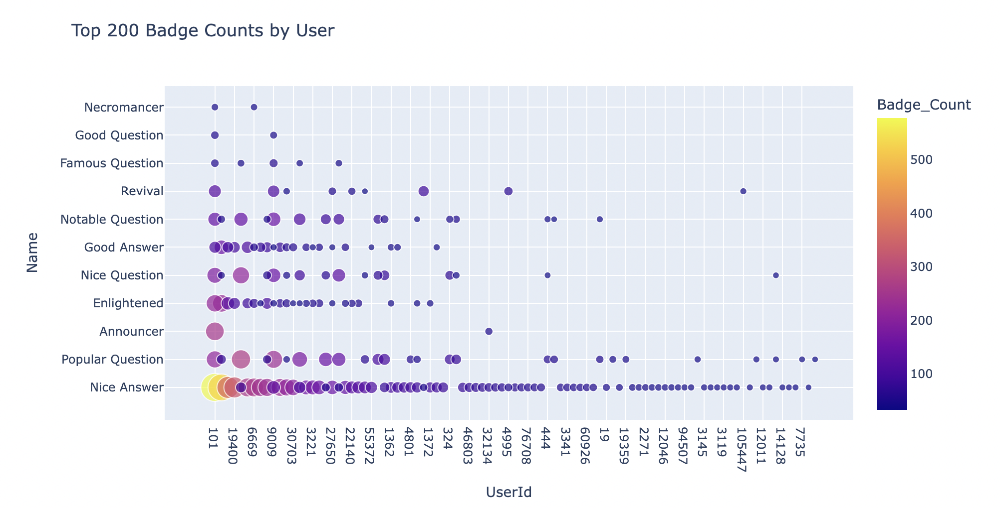

### Culling out the related Comments for the Users with the most Badges

In [64]:
df_comments_subset = comments.UserId.isin(top_x.UserId)
target_users_subset = comments.loc[df_comments_subset, :].copy()
print(target_users_subset.shape)
target_users_subset.head()

(107195, 6)


,Id,PostId,Score,Text,CreationDate,UserId
3,12,26,3,"Where are you starting from, and what sort of ...",2011-06-21 20:44:09.990,26.0
24,33,45,1,You should be aware the cars not from companie...,2011-06-21 21:25:43.263,19.0
27,38,67,0,"NBA, Orlando Magic?",2011-06-21 21:35:15.520,19.0
28,39,13,0,I think in all countries are different ways to...,2011-06-21 21:37:05.957,19.0
30,41,13,0,That's not me..,2011-06-21 21:37:53.197,19.0


In [65]:
target_users_subset.tail()

,Id,PostId,Score,Text,CreationDate,UserId
299387,472749,184930,1,Tell the doctor that you NEED that documentati...,2023-12-02 15:02:17.990,27650.0
299391,472754,184912,0,@mic: I have no problem with DB Navigator eith...,2023-12-02 17:20:11.817,13971.0
299394,472757,184921,1,@Hilmar I did the same with two kids once at t...,2023-12-02 19:15:37.757,1893.0
299397,472760,184803,0,Are you looking for a specific price range? If...,2023-12-03 02:43:04.597,9009.0
299398,472761,184912,0,"@artemist: thanks for checking, that's super h...",2023-12-03 02:45:13.343,13971.0


#### Removing dirty data / special characters - Data Pre-Processing

In [66]:
def pre_process(text_col_data):
    text_col_data = text_col_data.str.replace('\xa0', ' ')
    text_col_data = text_col_data.str.replace('@', '')
    text_col_data = text_col_data.str.replace('<br/>', '')
    text_col_data = text_col_data.str.replace('&gt', '')
    text_col_data = text_col_data.str.replace('&lt', '')
    text_col_data = text_col_data.str.replace('&amp', '')
    return text_col_data

In [67]:
target_users_subset.Text = target_users_subset.Text.astype('string')
target_users_subset.Text = pre_process(target_users_subset.Text)
target_users_subset.head()

,Id,PostId,Score,Text,CreationDate,UserId
3,12,26,3,"Where are you starting from, and what sort of ...",2011-06-21 20:44:09.990,26.0
24,33,45,1,You should be aware the cars not from companie...,2011-06-21 21:25:43.263,19.0
27,38,67,0,"NBA, Orlando Magic?",2011-06-21 21:35:15.520,19.0
28,39,13,0,I think in all countries are different ways to...,2011-06-21 21:37:05.957,19.0
30,41,13,0,That's not me..,2011-06-21 21:37:53.197,19.0


In [68]:
target_users_subset.tail()

,Id,PostId,Score,Text,CreationDate,UserId
299387,472749,184930,1,Tell the doctor that you NEED that documentati...,2023-12-02 15:02:17.990,27650.0
299391,472754,184912,0,mic: I have no problem with DB Navigator eithe...,2023-12-02 17:20:11.817,13971.0
299394,472757,184921,1,Hilmar I did the same with two kids once at th...,2023-12-02 19:15:37.757,1893.0
299397,472760,184803,0,Are you looking for a specific price range? If...,2023-12-03 02:43:04.597,9009.0
299398,472761,184912,0,"artemist: thanks for checking, that's super he...",2023-12-03 02:45:13.343,13971.0


### Polarisation of Comments - Analysis - Let us introduced new columns to understand the sentiments

In [69]:
pip install -U textblob

Note: you may need to restart the kernel to use updated packages.


In [70]:
from textblob import TextBlob, Word, Blobber
from textblob.classifiers import NaiveBayesClassifier
from textblob.taggers import NLTKTagger

In [71]:
target_users_subset['Polarity_Check'] = target_users_subset.Text.map(lambda text: TextBlob(text).sentiment.polarity)
target_users_subset['Word_Count'] = target_users_subset.Text.apply(lambda x: len(str(x).split()))
target_users_subset.head()

,Id,PostId,Score,Text,CreationDate,UserId,Polarity_Check,Word_Count
3,12,26,3,"Where are you starting from, and what sort of ...",2011-06-21 20:44:09.990,26.0,0.000000,15
24,33,45,1,You should be aware the cars not from companie...,2011-06-21 21:25:43.263,19.0,0.250000,17
27,38,67,0,"NBA, Orlando Magic?",2011-06-21 21:35:15.520,19.0,0.500000,3
28,39,13,0,I think in all countries are different ways to...,2011-06-21 21:37:05.957,19.0,-0.077778,13
30,41,13,0,That's not me..,2011-06-21 21:37:53.197,19.0,0.000000,3


### Analyzing the Positive and Negative Comments using the "Polarity_Check" column

#### POSITIVE COMMENTS

In [72]:
positive_check = target_users_subset.Polarity_Check == 1
negative_check = target_users_subset.Polarity_Check == -1

positive_comments = target_users_subset.loc[positive_check, 'Text'].sample(12).values # Taking only 12  
display(Markdown('#### Some of the "Positive" Comments'))
for comment in positive_comments:
    display(Markdown(f'* {comment}'))

#### Some of the "Positive" Comments

* If he plans to visit you soon, then you can always give it to him then. Otherwise you're probably best off to send it via UPS/DHL/whoever.

* Def not off topic, comes under event travel, see http://travel.stackexchange.com/questions/210/where-would-be-the-optimal-place-to-watch-the-nov-2012-solar-eclipse-from as another example :D

* The best source of information for this is the airline. Which airline are you flying?

* O.R.Mapper Best way to avoid claustrophobia is to [train surf as locals do](https://www.youtube.com/watch?v=T9TmX-mDYJU).

* In that case, my point still stands - if you'd get in a car, why not a plane :D

* ABlueCrayon Best to get an Exit-entry visa then

* From a train and onwards driving perspective, Crewe or Shrewsbury or Chester look your best bets to me, but I've not looked into the car hiring part for any of those

* If you are self employed, you should include the formation documents like they asked for.   A job that is cash-based presents risk of absconding, and you can expect difficulty. Tax returns that dove tail with bank statements is the best practices solution.

* isanae done, I hope you approve now :D :D

* The 4th rule of thermodynamics regarding the conservation of keystrokes does not apply in this instance, and somehow people manage to cope with it. See http://travel.stackexchange.com/questions/64893/separate-visa-for-husband-and-wife-for-uk-visitor-visa  for 'best practices'.  Also http://travel.stackexchange.com/questions/51582/how-should-a-family-with-young-children-apply-for-uk-visas/51592#51592

* This is excellent! One question: suppose an applicant has statements that show a "funds parking" pattern, but they have a legitimate explanation for the transfers (an annual bonus or commission check, a bona fide gift from a family member, an inheritance, transfer of funds from another account, etc...). How should they document and explain this situation in their application?

* FedericoPoloni Ciao. I didn't put kebab in the list because it just doesn't belong there. It's a matter of gastronomical pride. :D

#### NEGATIVE COMMENTS

In [73]:
negative_comments = target_users_subset.loc[negative_check, 'Text'].sample(12).values
display(Markdown('#### Some of the "Negative" Comments'))
for comment in negative_comments:
    display(Markdown(f'* {comment}'))

#### Some of the "Negative" Comments

* I would start with the airport's lost and found department.  But if it's been two weeks and there's no sign of the documents, I would assume the worst, get them all reported lost/cancelled (this will probably require a police report) and start working on replacements.

* IAD is one of the worst airports when it comes to customs and immigrations..

* WGroleau It's not for nothing that it's known as the worst highway in the world!

* I have edited this answer to take out the worst of the remarks about hostels and their users.

* I don't even know where to start. This sounds like a terrible plan.

* Worst case scenario you just go to the nearest ATM. What's the problem?

* That's kinda terrifying...

* Where did the offense occur?  Have you been convicted?  Besides there is Preclearance in Canada for US immigration so at worst you won't be allowed to board the plane.

* JoeBlow No offense, but you're pulling this out of your ass.  Commissioning, editing and laying out content accounts for the bulk of a book's cost and is all costed on a per-page basis, so publishers watch their page counts like hawks, and one of the worst sins for a travel author is to exceed their allocated page count.  This applies to phrasebooks too.

* But see [this answer](http://travel.stackexchange.com/a/46603/19400) reporting that the 787 had the *worst* GPS experience.

* Why is it cruel to find a mother with an infant?

* It will be a boring ride, no guns!

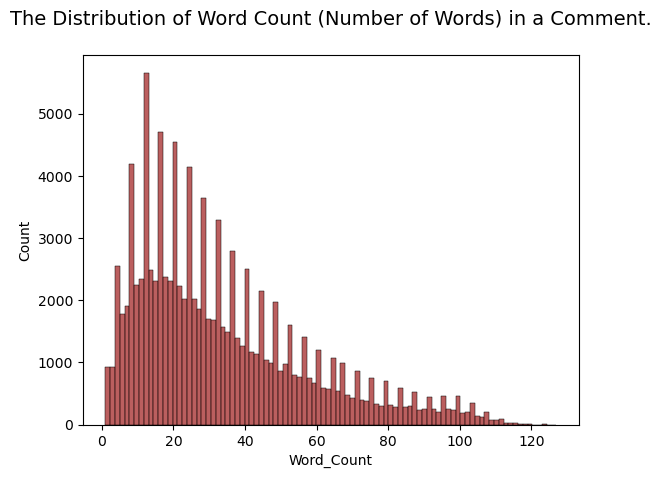

In [74]:
plt.title('The Distribution of Word Count (Number of Words) in a Comment.\n', fontsize=14)
sns.histplot(data=target_users_subset, x='Word_Count', color = "brown")
plt.show()

#### Most of the comments are around 15 to 25 words. There are at regular intervals spikes in the word count as well. Could this be attributed to bots trying to post comments rather than humans. We clearly do not know. But if we analyse deeper we might be able to figure it out. Only bot or something that is generative and done by automated models will be able to consistently post comments almost around the same length.

In [75]:
target_users_sort = target_users_subset.sort_values(['CreationDate'])
target_users_sort['Month'] = target_users_sort.CreationDate.apply(lambda x: x.month) # Extract the month.
target_users_sort['Year'] = target_users_sort.CreationDate.apply(lambda x: x.year) # Extract the year.
#Grouping and Aggregating
target_users_grouped = target_users_sort.groupby(['Year', 'Month', 'UserId'], as_index=False)['Polarity_Check'].mean()

target_users_grouped['Date'] = target_users_grouped[['Year', 'Month']].apply(
    lambda x: '-'.join(x.values.astype(str)), axis=1) # Merge the two columns into one. 

target_users_grouped.drop(['Year', 'Month'], axis=1, inplace=True)
target_users_grouped.Date = pd.to_datetime(target_users_grouped.Date) # Convert to datetime.

target_users_grouped.head()

,UserId,Polarity_Check,Date
0,19.0,0.080434,2011-06-01
1,26.0,0.068006,2011-06-01
2,46.0,-0.010965,2011-06-01
3,101.0,0.238181,2011-06-01
4,108.0,0.147386,2011-06-01


In [76]:
Z = 5
top_z = badge_stats.sort_values(by='Badge_Count', ascending=False)
top_z.reset_index(drop=True, inplace=True)
top_z = top_z.iloc[:Z,:]

top_mask = target_users_grouped.UserId.isin(top_z.UserId)
top_users = target_users_grouped.loc[top_mask, :]

fig = px.line(top_users, x='Date', y='Polarity_Check', color='UserId')
fig.show()

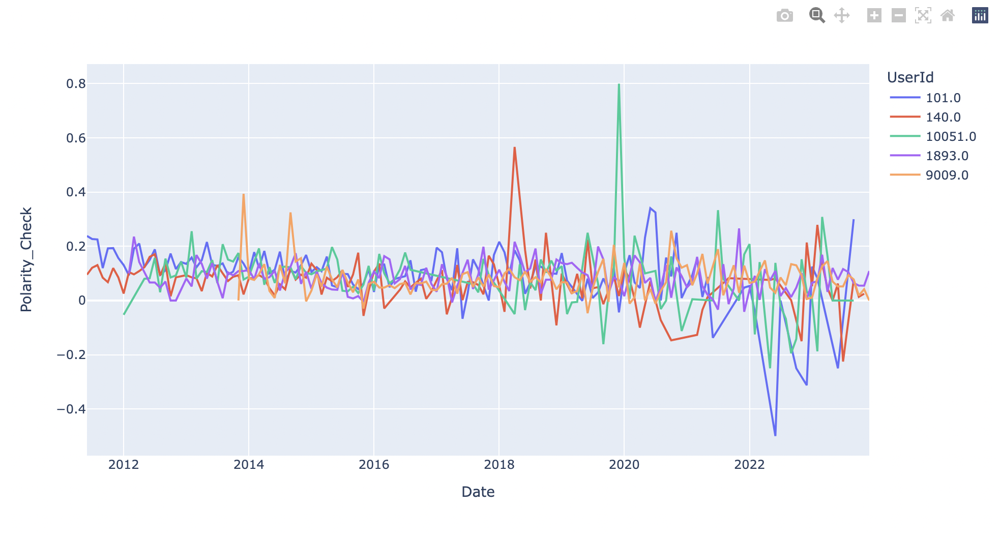

#### We cannot infer much from the above plot.

### TAGS Analysis

#### Which are the most popular tags ?

In [77]:
pop_tags = tags.groupby(['Id', 'TagName', 'Count'], as_index=False)['Count'].sum()
pop_tags.sort_values(ascending=False, by='Count', inplace=True)
pop_tags.reset_index(drop=True, inplace=True)
pop_tags['Scale'] = (pop_tags.Count/100).astype(int)
top_100_tags = pop_tags.loc[:100, :].copy()

tag_word_cloud = []
for i in range(len(top_100_tags)):
    value = (top_100_tags.TagName.iloc[i] + ',') * top_100_tags.Scale.iloc[i]
    tag_word_cloud.append(value)

#### Visualizing the Popular Tags Word Cloud 

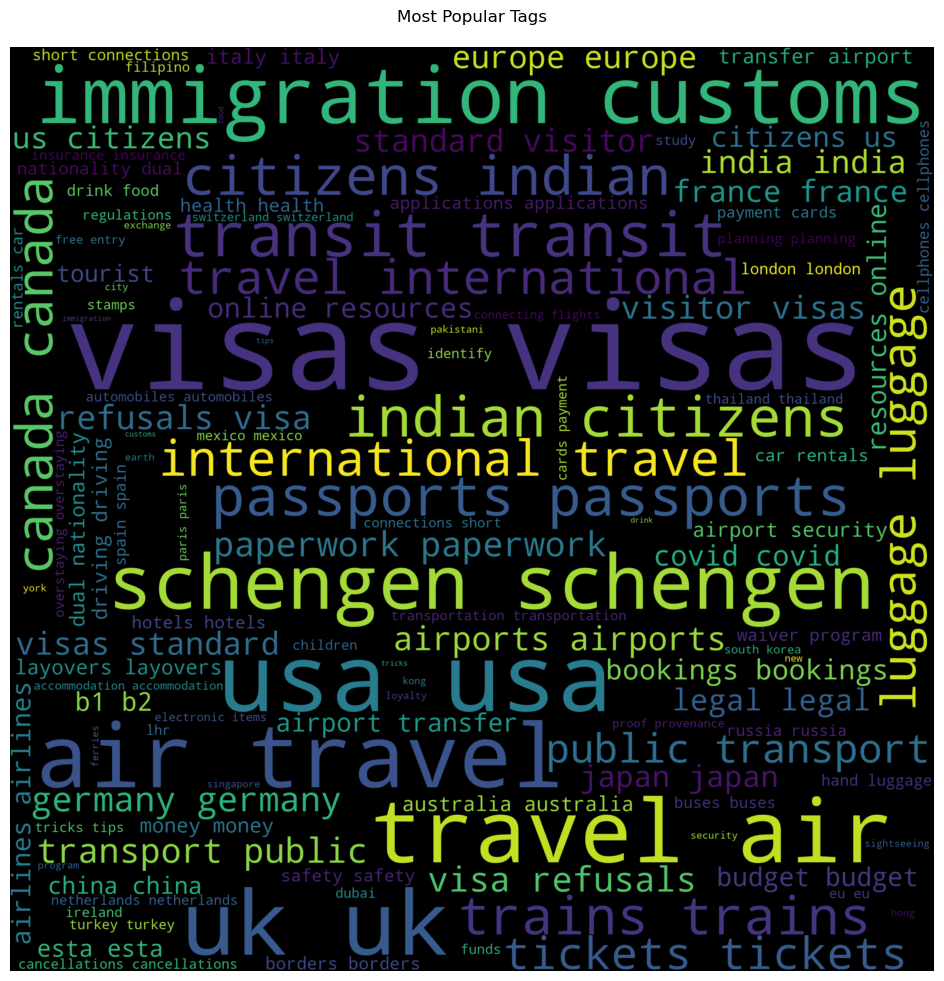

In [78]:
# Prepare the Series object ready to be mapped. 
tag_names = ''.join(str(tag_word_cloud).split(",'"))
tag_names = ' '.join(str(tag_names).split(","))
tag_names = ''.join(str(tag_names).split("\'"))

# Set word cloud parameters
wordcloud = WordCloud(width = 2500, height = 2500, margin=5, background_color='black', min_font_size = 10, repeat=False).generate(tag_names)

# Display the word cloud:
plt.figure(figsize = (15, 12), facecolor = None) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.title('Most Popular Tags\n')
plt.show()

#### From the Word Cloud we can see that the most commonly used tag in the forum are "visas", "immigration", "customs", "luggage". Therefore the people who are using this forum want to know about Visas, Immigration realted Questions, What to Carry, What Not to Carry and the luggage quantum. To find out which are the countries they are checking this information about is to first get a list of countries through web scrapping using BeautifulSoup package.

In [79]:
from bs4 import BeautifulSoup
import requests

# We require the country table from this website. 
req = requests.get('https://currentaffairs.adda247.com/countries-capital-and-currencies/')
soup = BeautifulSoup(req.content, 'html.parser') # The html content of the site.

rows = soup.find("table").find_all("tr")         # Scrapping all rows in the table
names = rows[0].find_all("td")                    # Scrapping the first row which has the - Column Names
columns = [names[i].get_text() for i in range(len(names))] # Extracting the column names. 
countries = pd.DataFrame(columns = columns)      # Creating a dataframe with the column names. 

for row in rows[1:]:
    row_tags = row.find_all("td")
    row_txt = [row_tags[i].get_text() for i in range(len(names))]
    countries.loc[len(countries)] = row_txt
    
countries.head()

,Country,Capital,Currency
0,Afghanistan,Kabul,Afghani
1,Albania,Tirane,Lek
2,Algeria,Algiers,Dinar
3,Andorra,Andorra la Vella,Euro
4,Angola,Luanda,New Kwanza


In [80]:
countries.shape

(195, 3)

#### We can see that the countries are loaded by scrapping the table from a website. There are 195 countries that are loaded onto the countries dataframe after it has been scrapped using the soup function. This countries will serve as a sort of look up or reference table for us when we run through the tags in the analysis dataset.

#### We will not go ahead and create some custom functions that will help up arrive at the most queried countries in the forum. The split_tags function is used to clean up and split the tag field where only a string of words will remain for our further processing.

In [81]:
def split_tags(tag_list):
    tag_list = tag_list.astype('string')
    tag_list = tag_list.str.replace('<', ' ')
    tag_list = tag_list.str.replace('>', ' ')
    
    return tag_list

#### This next function converts the text that is split by using the split_tags function into a list of words. This list of words can then be compared to the country list table that has been extracted using the BeautifulSoup function.

In [82]:
from textblob import Word
nltk.download('punkt')

def check_country(tag, country_list):
    text = TextBlob(tag)
    words = text.words
    if country_list.isin(words).any():
        return True
    else:
        return False

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/surajmathewthomas/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [83]:
posts_tags = posts_clean.copy()
clean_tags = split_tags(posts_tags.Tags)
countries['Country'] = countries['Country'].str.lower()

country_list = []
for tags in clean_tags:
    country_list.append(check_country(tags, countries['Country']))

In [84]:
posts_taged_country = posts_tags.loc[country_list, :].copy()
posts_taged_country.head()

,Id,PostTypeId,AcceptedAnswerId,CreationDate,Score,ViewCount,Body,OwnerUserId,LastActivityDate,Title,Tags,AnswerCount,CommentCount,ClosedDate
3,5,1,770.0,2011-06-21 20:25:56.787,14,520.0,<p>Another definition question that interested...,13.0,2012-10-12 20:49:08.110,What is the easiest transportation to use thro...,<romania><transportation>,5.0,0,NaN
6,9,1,178.0,2011-06-21 20:31:21.800,13,1844.0,<p>We are considering visiting Argentina for u...,23.0,2016-01-01 21:58:02.303,What are must-visit destinations for the first...,<sightseeing><public-transport><transportation...,4.0,1,2016-01-02T10:26:48.277
8,11,1,198.0,2011-06-21 20:32:25.950,30,3139.0,<p>I'm planning on taking the trans-Siberian /...,30.0,2019-01-02 01:19:44.673,What is the best way to obtain visas for the T...,<russia><visas><china><mongolia><trans-siberian>,4.0,1,NaN
10,13,1,1608.0,2011-06-21 20:34:22.563,13,664.0,"<p>I need to travel from Cusco, Peru to La Paz...",22.0,2015-04-23 22:35:31.370,Where can I find up-to-date information about ...,<online-resources><transportation><peru><south...,2.0,4,NaN
11,14,1,NaN,2011-06-21 20:34:23.453,10,508.0,<p>I am aware of travel agencies catering to U...,23.0,2011-10-07 21:11:29.223,Is it advisable for US citizen to attempt a vi...,<us-citizens><travel-agents><cuba>,3.0,4,NaN


#### This new data frame is a extract where country names are present as tags in the Tags columns. We will now attempt to find out which are the countries that have the most tags. In other words which are the countries that have the most questions and the users are planning to visit. This could help coming up with a dedicated help section or Knowledge Videos done for these specific countries on travel related topics.

In [85]:
country_mentioned_tag = []

for tags in clean_tags[country_list]:
    blob = TextBlob(tags)
    words = blob.words
    for word in words:
        if countries['Country'].str.contains(word).any():
            country_mentioned_tag.append(word)

In [86]:
country_mentioned = country_mentioned_tag.copy()
country_mentioned = pd.DataFrame(country_mentioned)
country_mentioned.rename(columns={ 0 :'Countries'}, inplace=True)
country_mentioned['Count'] = 1
country_mentioned_grouped = pd.DataFrame(country_mentioned.groupby(['Countries'], as_index=False)['Count'].sum())
country_mentioned_grouped.sort_values('Count', ascending=False, inplace=True)
country_mentioned_grouped.reset_index(drop=True, inplace=True)
country_mentioned_grouped.loc[:12,:] # Top 12 mentioned countries.

,Countries,Count
0,canada,1595
1,germany,1297
2,india,1099
3,france,1059
4,japan,972
5,china,784
6,italy,751
7,australia,735
8,spain,588
9,uk,567


#### The above is the most used tags as far as countries are concerned. People in the forum are learning deatils about immigration, visas, tavel to Canada, Germany, India, France and Japan. These are the top 5 countires people are enquiring about before they travel/migrate.


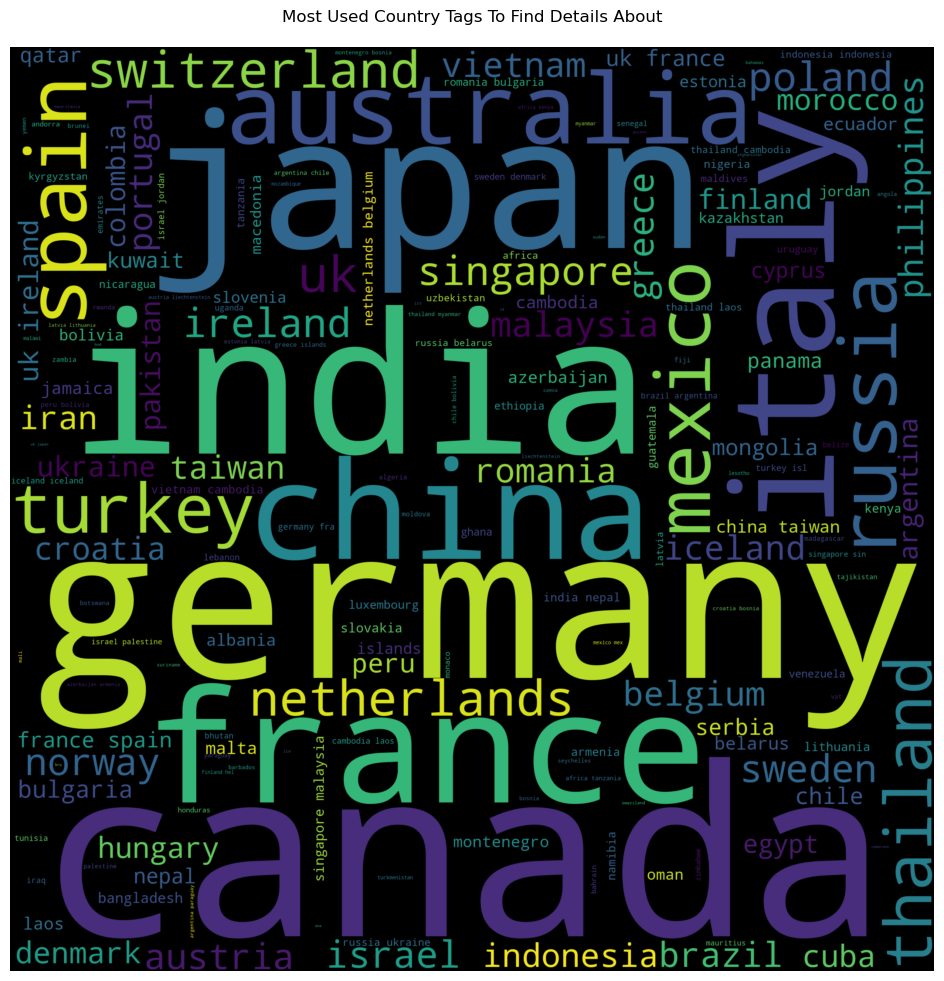

In [87]:
# Prepare the Series object ready to be mapped. 
country_names = ' '.join(str(country_mentioned_tag).split("\', '"))

# Set word cloud parameters
wordcloud = WordCloud(width = 2500, height = 2500, margin=5, background_color='black', min_font_size = 10, repeat=False).generate(country_names)

# Display the word cloud:
plt.figure(figsize = (15, 12), facecolor = None) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)
plt.title('Most Used Country Tags To Find Details About\n')
plt.show()

#### We can see the top 5 countires in big bold wordings and their size in this word cloud

In [88]:
G = 12
top_g = country_mentioned_grouped.loc[ :G, :]

title = f'Top {G} Countries tagged in Posts to know more about before travelling'
fig = px.bar(top_g, x='Countries', y='Count', color='Countries', title=title)
fig.show()

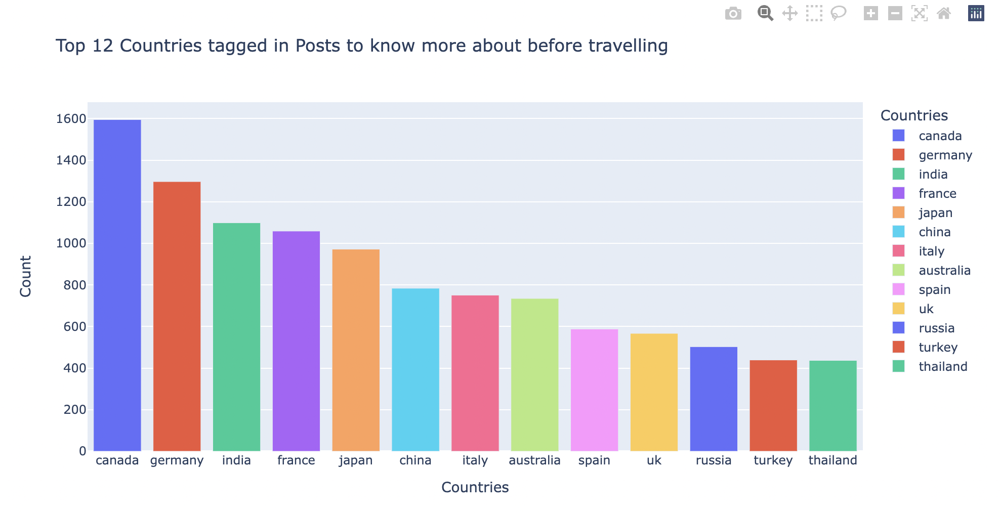

#### We can see the bar graphs of the top 12 country tags by their count ordered in the descending order. People using the travel forum are curious to know about the top travel related topics for these top 12 countries.

#### Next in order the get the top posts viewed by people in terms of count and how the polarity of the post is (postive or negative), we will first pre_process the posts and call the sentiment polarity function.

In [89]:
posts_polarity = posts_clean.copy()
posts_polarity.drop(['PostTypeId', 'LastActivityDate'], axis=1, inplace=True)
posts_polarity.Body = pre_process(posts_polarity.Body)
posts_polarity['Polarity'] = posts_polarity.Body.map(lambda text: TextBlob(text).sentiment.polarity)
posts_polarity.head()

,Id,AcceptedAnswerId,CreationDate,Score,ViewCount,Body,OwnerUserId,Title,Tags,AnswerCount,CommentCount,ClosedDate,Polarity
0,2,NaN,2011-06-21 20:22:33.760,43,3659.0,"<p>This was one of our definition questions, b...",13.0,How can I find a guide who will take me safely...,<guides><extreme-tourism><amazon-river><amazon...,8.0,4,NaN,0.152500
2,4,NaN,2011-06-21 20:24:57.160,8,301.0,<p>Singapore Airlines has an all-business clas...,24.0,Does Singapore Airlines offer any reward seats...,<loyalty-programs><routes><ewr><singapore-airl...,1.0,1,NaN,0.000000
3,5,770.0,2011-06-21 20:25:56.787,14,520.0,<p>Another definition question that interested...,13.0,What is the easiest transportation to use thro...,<romania><transportation>,5.0,0,NaN,0.200000
4,6,12.0,2011-06-21 20:26:53.323,89,8093.0,"<p>A year ago I was reading some magazine, and...",19.0,How can I visit Antarctica?,<extreme-tourism><antarctica>,6.0,9,NaN,0.500000
5,8,62.0,2011-06-21 20:30:38.687,15,12989.0,<p>Can anyone suggest the best way to get from...,26.0,Best way to get from SeaTac airport to Redmond?,<public-transport><airport-transfer><taxis><sea>,3.0,3,NaN,0.306061


In [90]:
K = 250

posts_pol_sorted = posts_polarity.sort_values(by='ViewCount', ascending=False)
posts_pol_sorted.reset_index(drop=True, inplace=True)
posts_top_views = posts_pol_sorted.loc[:K, :]
posts_top_views

fig = px.scatter(data_frame=posts_top_views, 
                 y='ViewCount',
                 x='Polarity',
                 size='ViewCount',
                color='Polarity',
                title=f'Top {K} Viewed Posts Coloured by Sentiment')

fig.show()

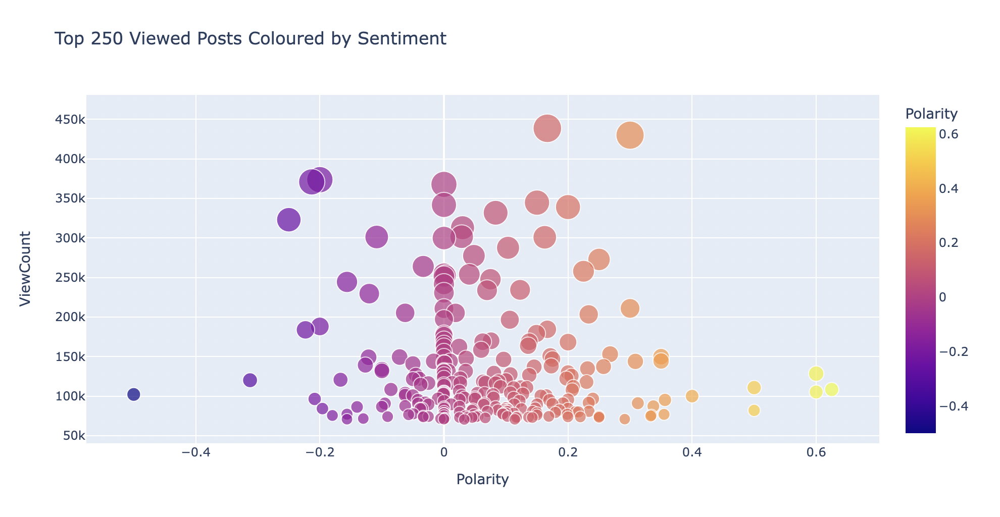

#### Based on the above graph we can see that posts that have a positive polarity or posts that convey positive sentiments are viewed much more than those that have negative sentiments. In logic senes people come to these forums to get a positive response to the questions they have.

In [91]:
posts_polarity.Polarity.describe()

count    46744.000000
mean         0.078055
std          0.149488
min         -1.000000
25%          0.000000
50%          0.053977
75%          0.145704
max          1.000000
Name: Polarity, dtype: float64

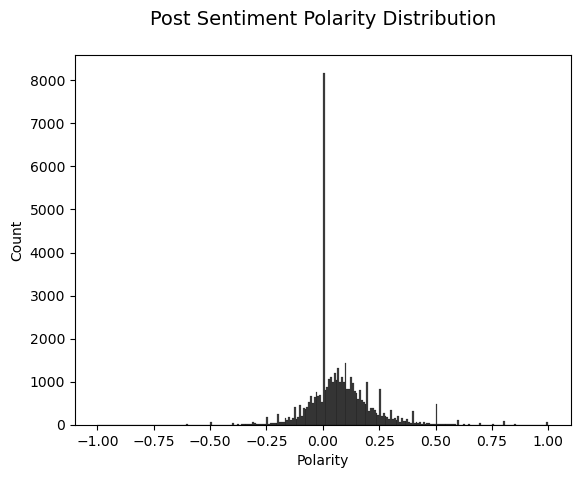

In [92]:
plt.title('Post Sentiment Polarity Distribution\n', fontsize=14)
sns.histplot(data=posts_polarity, x='Polarity', color = "black")
plt.show()

#### Most of the posts are having a positve tone and are looking at solving problems and answering the travel related that people/travellers have. The histogram also shows that there are a lot of neutral posts and answers. The majority are still in the tending towards the positive polarity scale. 

### Conclusion

* In this task, we have downloaded the XML files from the external stack overflow internet library. The XML files contained user actions grouped in files like badges, posts, comments, post history, tags etc. These were then transformed into csv files so it can be read and analysed using this Jupyter Notebook. 

* Once the files were transformed, the files were individually analysed and pre-processed using the data wrangling techniques. Columns were typecaste into their relevant datatype. For example, date objects were converted to date time data type. Missing Value analysis was done and the irrelevant rows and columns were eliminated for further analysis.

* Word Clouds were formed to see what is the most tagged topics and what are the most common posts, and the most common badges. Based on these we wanted to find out for which countries (to travel to) these posts posted. Therefore, we did some webscrapping and got a table of countries to look up the extracted tags, badged and key words and found the top 12 countries where people were interested in knowing about visas, travel, luggage and other questions.

* Finally sentiment analysis was also done in order to gauge which are the most liked posts and where the sentiments of the forum was tending towards. Did it have a positive, negative or neutral connotation.


#### Reference

* Minimilast Data Wrangling with Python (v1.0.3.9011), Marek Gagolewski, Missing, censored, and questionable data, https://datawranglingpy.gagolewski.com/chapter/520-missingness.html, accessed 2nd February 2024.
* Minimilast Data Wrangling with Python (v1.0.3.9011), Marek Gagolewski, Processing Data in Groups, https://datawranglingpy.gagolewski.com/chapter/430-group-by.html, accessed 2nd February 2024.
* Travel Dataset,https://archive.org/details/stackexchange, accessed 3rd February 2024.
* Beautiful Soup, https://realpython.com/beautiful-soup-web-scraper-python/, accessed on 3rd February 2024.
* BeautifulSoup + Requests | Web Scraping in Python, (June 27, 2023), Alex the Analyst,https://www.youtube.com/watch?v=bargNl2WeN4, accessed on 3rd February 2024.